## Encdoer Testing

### MUDB18

In [141]:
import numpy as np
import os
from tqdm import tqdm
import musdb
import librosa
mode = 'train'
root='/home/lego/NAS189/Database/musdb18/'
save_dir = os.path.join('/home/lego/NAS189/home/MUSDB18/',f'vocal_accomp_44100/{mode}/valid/')
if not os.path.isdir(save_dir):
    os.mkdir(save_dir)
mus = musdb.DB(root=root,subsets=mode, split='valid')
L = len(mus)
max_length = 0 
print(save_dir)
for i in tqdm(range(L)):
    track = mus[i].stems
    track = track[1:]
    #vocal = track[4,:,:]
    #accomp =track[1:4,:,:].sum(0)
    #assert vocal.shape == accomp.shape and len(vocal.shape) == 2
    #vocal = librosa.resample(np.transpose(vocal,(1,0)), 44100, 22050)
    #accomp = librosa.resample(np.transpose(accomp,(1,0)), 44100, 22050)
    track = np.transpose(track,(0,2,1))
    #accomp = np.transpose(accomp,(1,0))
    #audio = np.concatenate((vocal[np.newaxis,...], accomp[np.newaxis,...]))
    #assert audio.shape[0] == audio.shape[1] == 2, audio.shape
    assert track.shape[0] == 4 and track.shape[1] == 2 
    np.save(os.path.join(save_dir,str(i)), track)
    
    # (instrument, 2, length)
    

  0%|          | 0/14 [00:00<?, ?it/s]

/home/lego/NAS189/home/MUSDB18/vocal_accomp_44100/train/valid/


100%|██████████| 14/14 [04:52<00:00, 20.89s/it]


In [204]:
save_dir = os.path.join('/home/lego/NAS189/home/MUSDB18/','vocal_accomp_44100/test/1.npy')
np.load(save_dir).shape

(4, 2, 8835072)

In [1]:
from dataset.utils import STFT
from config import Open_Config as config
import torch
from tqdm import tqdm
import os 
import numpy as np

save_dir = os.path.join('/home/lego/NAS189/home/MUSDB18/','vocal_accomp_22050', )
names = os.listdir(save_dir)
stft_dir = os.path.join('/home/lego/NAS189/home/MUSDB18/','vocal_accomp_stft_44100')
if not os.path.isdir(stft_dir):
    os.mkdir(stft_dir)
device = torch.device(f'cuda:{config.cuda}')
extractor = STFT(config.cuda, **config.stft_params).to(device)
for name in tqdm(names):
    path = os.path.join(save_dir,name)
    
    audio = np.load(path)
    
    accomp = audio[[1]]
    accomp = torch.Tensor(accomp).to(device)
    accomp = extractor(accomp).squeeze()
    
    vocal = audio[[0]]
    vocal = torch.Tensor(vocal).to(device)
    vocal = extractor(vocal).squeeze()

    np.save(os.path.join(stft_dir, name.split('.')[0]+'a'), accomp.detach().cpu().numpy())
    np.save(os.path.join(stft_dir, name.split('.')[0]+'v'), vocal.detach().cpu().numpy())

/home/lego/anaconda3/lib/python3.7/site-packages/torchaudio/backend/utils.py:54: UserWarning: "sox" backend is being deprecated. The default backend will be changed to "sox_io" backend in 0.8.0 and "sox" backend will be removed in 0.9.0. Please migrate to "sox_io" backend. Please refer to https://github.com/pytorch/audio/issues/903 for the detail.
  '"sox" backend is being deprecated. '
  0%|          | 0/150 [00:00<?, ?it/s]/home/lego/anaconda3/lib/python3.7/site-packages/torch/functional.py:516: UserWarning: The function torch.rfft is deprecated and will be removed in a future PyTorch release. Use the new torch.fft module functions, instead, by importing torch.fft and calling torch.fft.fft or torch.fft.rfft. (Triggered internally at  /opt/conda/conda-bld/pytorch_1603729006826/work/aten/src/ATen/native/SpectralOps.cpp:590.)
  normalized, onesided, return_complex)
100%|██████████| 150/150 [06:57<00:00,  2.78s/it]


## DataSlicing

In [65]:
import torch
import numpy as np
import os
from tqdm import tqdm
sec = 60
path = os.path.join('/home/lego/NAS189/home/MUSDB18/','vocal_accomp_44100','train','valid')
save_dir = os.path.join(path, f'seg_{sec}sec')
if not os.path.isdir(save_dir):
    os.mkdir(save_dir)
idx = 0
window = sec*44100
for i in tqdm(range(14)):
    audio = np.load(os.path.join(path,str(i)+'.npy'))
    topad = window - (audio.shape[-1] % window)
    if topad != window:
        audio = np.pad(audio,((0,0), (0,0), (0,topad)),'constant', constant_values=0)
        
    assert audio.shape[-1] % window == 0 and audio.shape[-1] != 0, audio.shape
    for i in range(audio.shape[-1]//window):
        audio_seg = audio[...,i*window:i*window+window]
        if audio_seg.shape[-1] != window:
            continue
        np.save(save_dir+f'/{idx}.npy', audio_seg)
        idx += 1
print(audio_seg.shape)
print(idx)

100%|██████████| 14/14 [04:41<00:00, 20.12s/it]

(4, 2, 2646000)
67


In [12]:
import pandas as pd
import os
import numpy as np
from tqdm import tqdm
length = 40
mode = 'train/train'

root = '/home/lego/NAS189/home/MUSDB18/vocal_accomp_44100/' + mode
save_dir = os.path.join(root, str(length)+'.csv')
fl = os.listdir(root)
fl = [f for f in fl if '.npy' in f]
count = 0
df = pd.DataFrame(columns=['songid', 'start', 'end'])
for idx in tqdm(range(len(fl))):
    path = os.path.join(root,str(idx)+'.npy')
    x = np.load(path)
    l = x.shape[-1]
    pos = 0
    
    while pos < l:
        start = pos
        pos = end = min(l, pos+length*44100)
        df.loc[count] = [idx, start, end]
        count += 1
    assert pos == l

df.to_csv(save_dir)
    
    
# df = pd.Dataframe

100%|██████████| 86/86 [20:46<00:00, 14.50s/it]


NameError: name 'save_root' is not defined

In [15]:
import pandas as pd
import os
length = 40
mode = 'train/train'

root = '/home/lego/NAS189/home/MUSDB18/vocal_accomp_44100/' + mode
save_dir = os.path.join(root, str(length)+'.csv')
c = pd.read_csv(save_dir)
c

,Unnamed: 0,songid,start,end
0,0,0,0,1764000
1,1,0,1764000,3528000
2,2,0,3528000,5292000
3,3,0,5292000,7056000
4,4,0,7056000,7552000
...,...,...,...,...
515,515,85,0,1764000
516,516,85,1764000,3528000
517,517,85,3528000,5292000
518,518,85,5292000,7056000


1764000

In [59]:
1764000 - 13 * 128 * 1024

60064

In [60]:
(x[...,0,:] - x[...,0,:].mean()) / ((x[...,0,:].var()+1e-05)**0.5)

tensor([[-0.5238, -0.6292,  1.1531]])

In [247]:
import math
import torch.nn as nn
import torch
class PositionalEncoding(nn.Module):

    def __init__(self, d_model, dropout=0.1, max_len=300):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(1000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(1), :]
        return self.dropout(x)
    
    

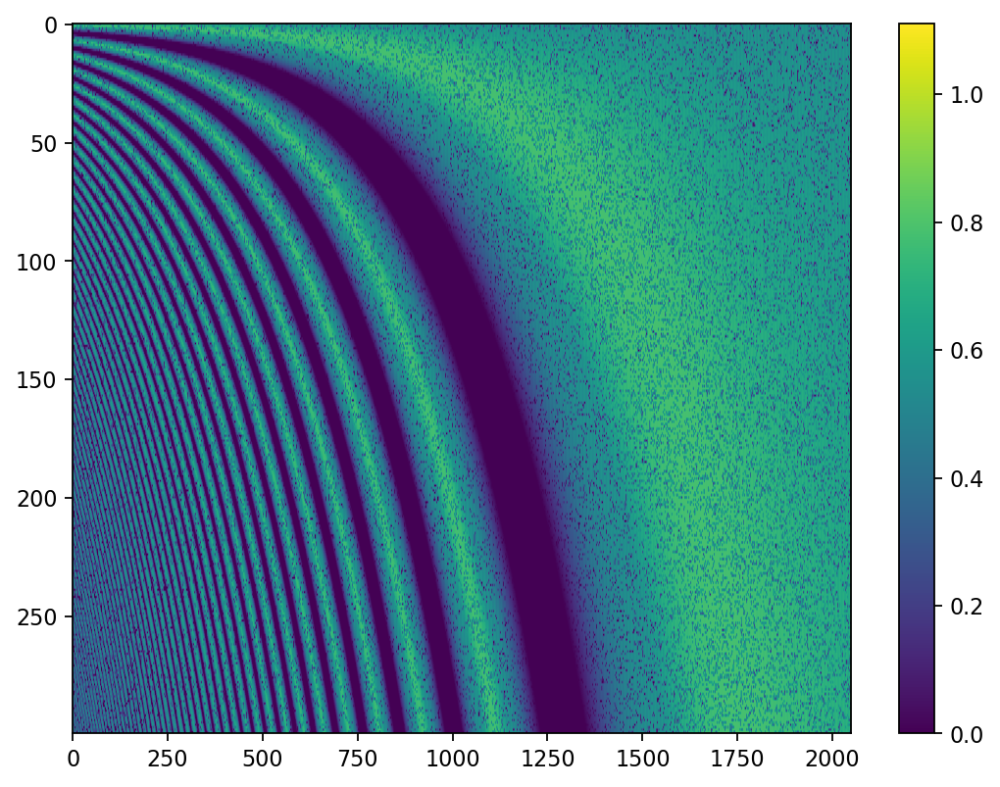

In [248]:
import matplotlib.pyplot as plt
m = PositionalEncoding(2048)
x = m(torch.zeros(4,300,2048))
fig = plt.figure(figsize=(8, 6), dpi=160)
plt.imshow(torch.relu(x[0]),aspect='auto')
plt.colorbar()

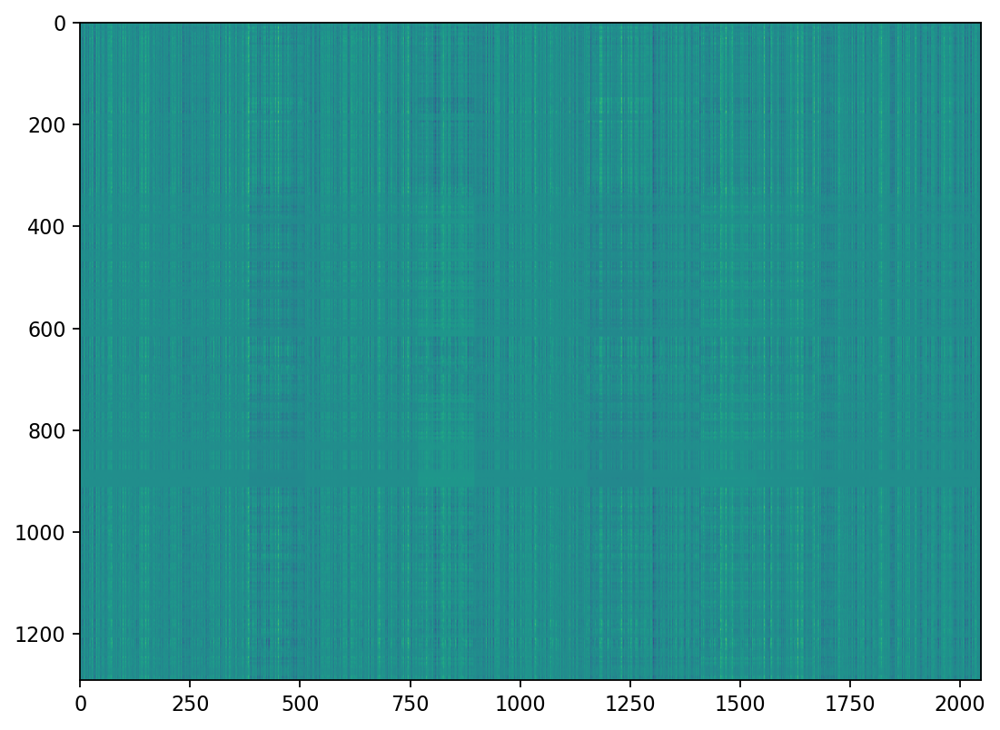

In [28]:
import librosa.display
librosa.display.specshow()

In [16]:
def bandwidth_to_max_bin(rate: float, n_fft: int, bandwidth: float) -> np.ndarray:
        """Convert bandwidth to maximum bin count
        Assuming lapped transforms such as STFT
        Args:
            rate (int): Sample rate
            n_fft (int): FFT length
            bandwidth (float): Target bandwidth in Hz
        Returns:
            np.ndarray: maximum frequency bin
        """
        freqs = np.linspace(0, rate / 2, n_fft // 2 + 1, endpoint=True)

        return np.max(np.where(freqs <= bandwidth)[0]) + 1

bandwidth_to_max_bin(44100, 4096, 20000)

1858

In [43]:
import torch
import torchaudio
import os
import numpy as np
import IPython.display as ipa
path = os.path.join('/home/lego/NAS189/home/MUSDB18/','vocal_accomp_44100','test')
save_dir =  os.path.join(path, 'seg_7sec')
x = np.load(save_dir+'/1792.npy').sum(1)

x = torch.Tensor(x[...,:-47000])
s = torch.stft(x, n_fft=4096, hop_length=1024, return_complex=True)

Mel = torchaudio.transforms.MelScale(n_mels = 256, sample_rate = 44100)
m = Mel(abs(s))

s_ = torch.nn.BatchNorm2d(4)(abs(s).unsqueeze(0))
s_ = s_.detach().numpy()

s = s.numpy()

print(s.shape)
ipa.Audio(x[3].numpy(), rate=44100)


(4, 2049, 256)


<AxesSubplot:xlabel='Time', ylabel='Hz'>

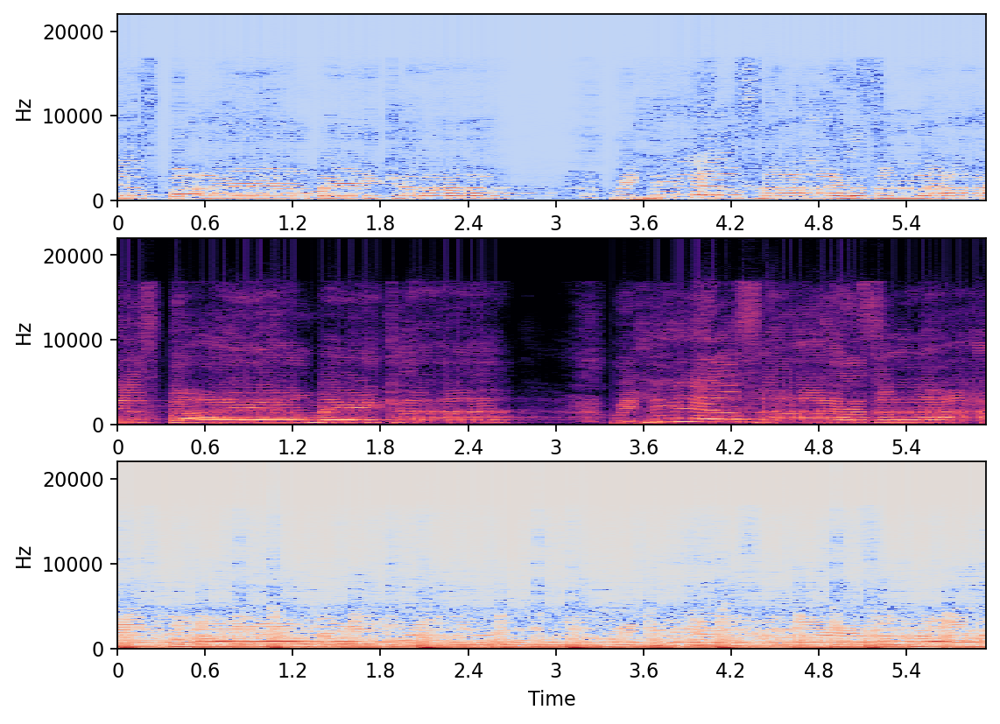

In [45]:
import matplotlib.pyplot as plt
import numpy as np
import librosa.display
import matplotlib.colors as colors


fig, ax = plt.subplots(3, figsize=(8, 6), dpi=160)
librosa.display.specshow(
                librosa.amplitude_to_db(np.abs(s_[0,3]), ), 
                y_axis='linear', 
                x_axis='time', 
                sr=44100,
                hop_length=1024,
                ax = ax[0]
            )
librosa.display.specshow(
                librosa.amplitude_to_db(np.abs(s[3]), ref=np.max), 
                y_axis='linear', 
                x_axis='time', 
                sr=44100,
                hop_length=1024,
                ax = ax[1]
            )
librosa.display.specshow(
                librosa.amplitude_to_db(np.abs(s_[0].sum(0)), ), 
                y_axis='linear', 
                x_axis='time', 
                sr=44100,
                hop_length=1024,
                ax = ax[2]
            )

<AxesSubplot:xlabel='Time', ylabel='Hz'>

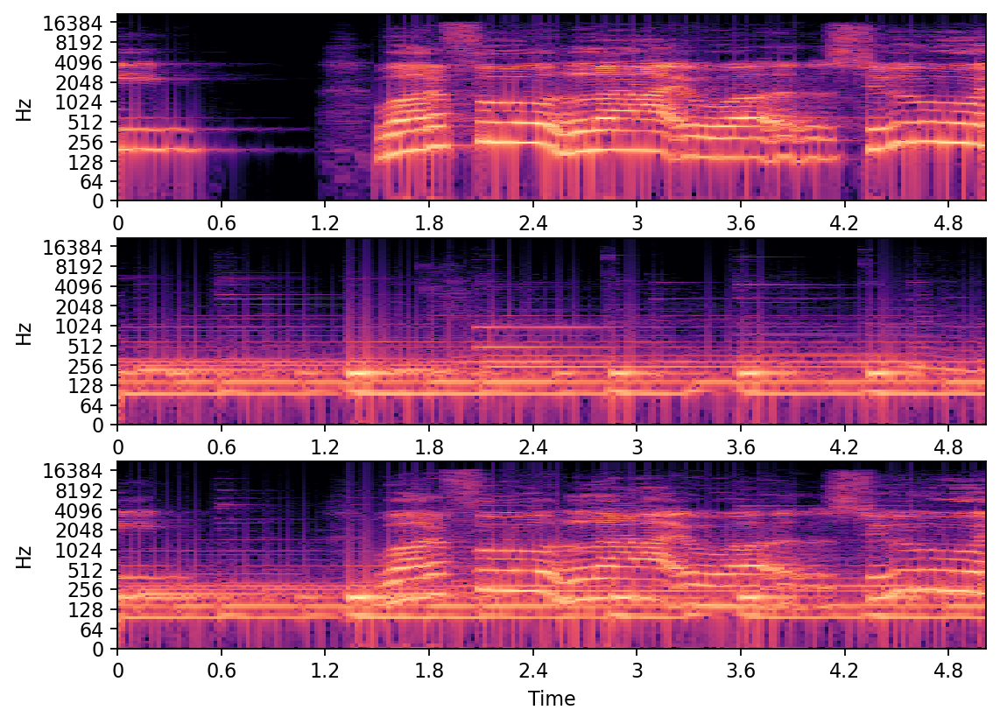

In [78]:
fig, ax = plt.subplots(3, figsize=(8, 6), dpi=160)
librosa.display.specshow(
                librosa.amplitude_to_db(np.abs(s[0]), ref=np.max), 
                y_axis='log', 
                x_axis='time', 
                sr=44100,
                hop_length=1024,
                ax = ax[0]
            )
librosa.display.specshow(
                librosa.amplitude_to_db(np.abs(s[1]), ref=np.max), 
                y_axis='log', 
                x_axis='time', 
                sr=44100,
                hop_length=1024,
                ax = ax[1]
            )
librosa.display.specshow(
                librosa.amplitude_to_db(np.abs(s.sum(0)), ref=np.max), 
                y_axis='log', 
                x_axis='time', 
                sr=44100,
                hop_length=1024,
                ax = ax[2]
            )

<AxesSubplot:xlabel='Time', ylabel='Hz'>

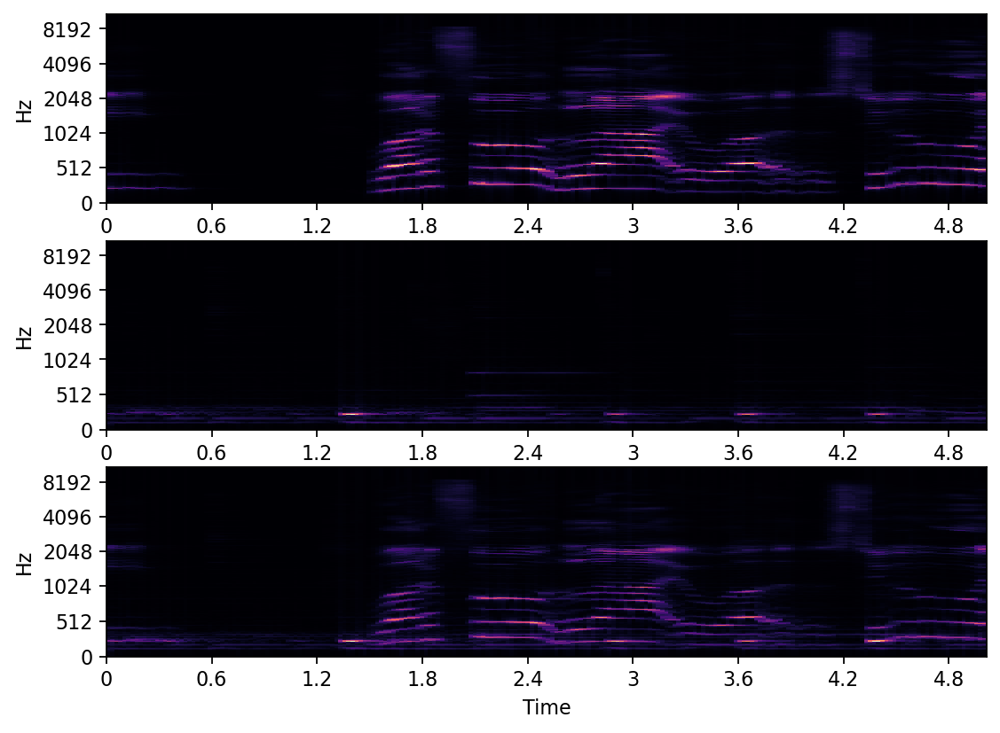

In [79]:
fig, ax = plt.subplots(3, figsize=(8, 6), dpi=160)
librosa.display.specshow(
                m[0].numpy(), 
                y_axis='mel', 
                x_axis='time', 
                sr=44100,
                hop_length=1024,
                ax = ax[0]
            )
librosa.display.specshow(
                m[1].numpy(), 
                y_axis='mel', 
                x_axis='time', 
                sr=44100,
                hop_length=1024,
                ax = ax[1]
            )
librosa.display.specshow(
                m.mean(0).numpy(), 
                y_axis='mel', 
                x_axis='time', 
                sr=44100,
                hop_length=1024,
                ax = ax[2]
            )

(8, 1, 4, 487, 123)


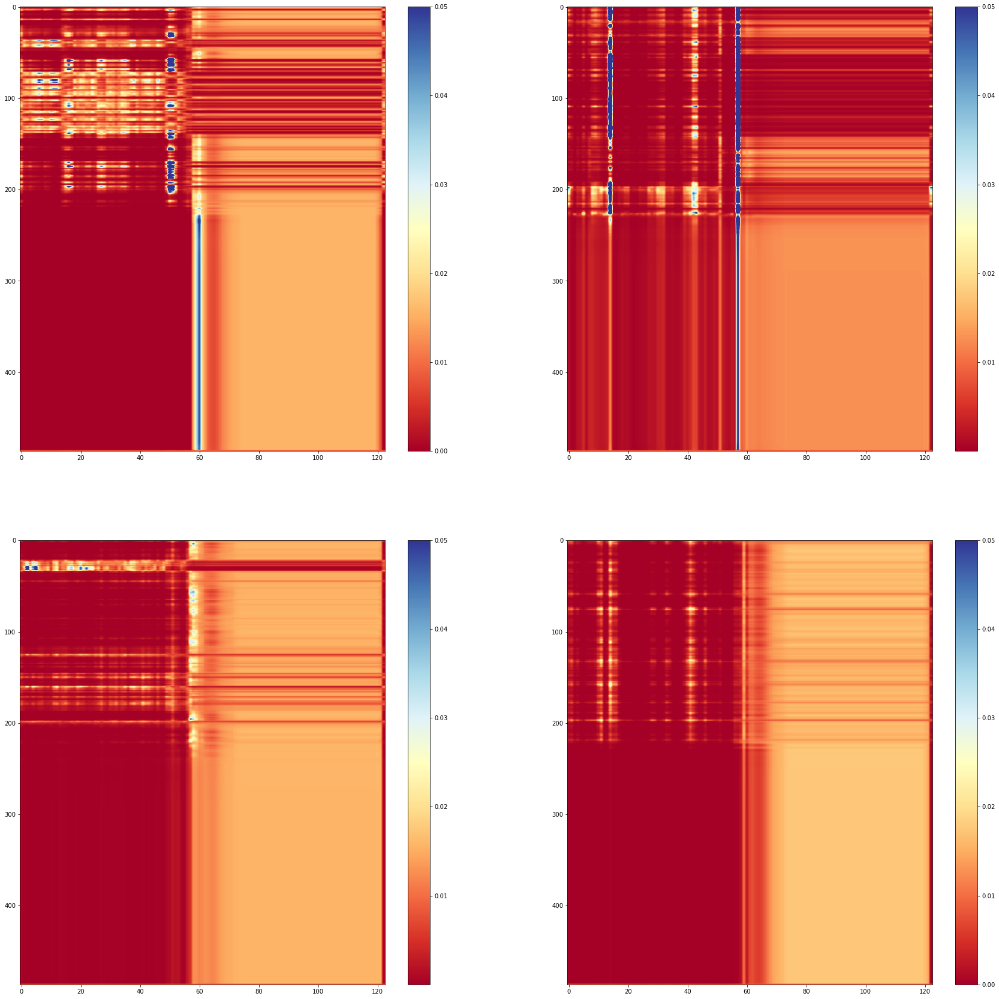

In [3]:
import matplotlib.pyplot as plt
import numpy as np

att = np.load('att_train.npy')
print(att.shape)
fig, ax = plt.subplots(2,2, figsize=(30,30))
cm = plt.cm.get_cmap('RdYlBu')
for i in range(2):
    for j in range(2):
        im = ax[i,j].imshow(att[7,0,i*2+j], aspect='auto', cmap=cm, vmax=0.05)
        fig.colorbar(im, ax=ax[i,j])

In [3]:
import numpy as np
import torch
from config import Open_Config as config
import IPython.display as ipa
s = np.load('m_stft.npy')
audio = torch.istft(torch.tensor(s[0]), **config.istft_params)
ipa.Audio(audio.numpy(), rate=44100)

/home/lego/anaconda3/lib/python3.7/site-packages/torch/functional.py:587: UserWarning: The function torch.irfft is deprecated and will be removed in a future PyTorch release. Use the new torch.fft module functions, instead, by importing torch.fft and calling torch.fft.ifft or torch.fft.irfft. (Triggered internally at  /opt/conda/conda-bld/pytorch_1603729006826/work/aten/src/ATen/native/SpectralOps.cpp:602.)
  normalized, onesided, length, return_complex)


In [6]:
import torch
params = torch.load('/home/lego/NAS189/home/MUSDB18/params/100sec_vocal_learntemp_light_0.pkl')
print(params['softmax_temp'])
print(sum(p.numel() for p in params.values())/1000000)
for p in params:
    print(p)
    print( params[p].numel()/1000000)
    print('----------------')

tensor([0.9077], device='cuda:2')
11.160618
softmax_temp
1e-06
----------------
DePreNet_.0.weight
1.8e-05
----------------
DePreNet_.0.bias
1e-06
----------------
DePreNet_.2.weight
0.761344
----------------
DePreNet_.2.bias
0.000512
----------------
DePreNet_.4.weight
0.001536
----------------
DePreNet_.4.bias
0.000512
----------------
DePreNet_.5.weight
0.262144
----------------
DePreNet_.5.bias
0.000512
----------------
PosNet.1.weight
0.262144
----------------
PosNet.1.bias
0.000512
----------------
PosNet.2.weight
0.000512
----------------
PosNet.2.bias
0.000512
----------------
PosNet.2.running_mean
0.000512
----------------
PosNet.2.running_var
0.000512
----------------
PosNet.2.num_batches_tracked
1e-06
----------------
PosNet.4.weight
0.001536
----------------
PosNet.4.bias
0.000512
----------------
PosNet.5.weight
0.262144
----------------
PosNet.5.bias
0.000512
----------------
PosNet.7.weight
1.049088
----------------
PosNet.7.bias
0.002049
----------------
PosNet.10.weigh

In [261]:
x = torch.arange(10) / 32
torch.softmax(x, dim=-1)

tensor([0.0865, 0.0893, 0.0921, 0.0950, 0.0981, 0.1012, 0.1044, 0.1077, 0.1111,
        0.1146])

In [85]:
torch.ones(1,2,1).squeeze(0).shape

torch.Size([2, 1])

In [88]:
import torch
x = torch.arange(8).view(1,-1)
x * torch.tensor([2,1,2,3]).view(-1,1)


tensor([[ 0,  2,  4,  6,  8, 10, 12, 14],
        [ 0,  1,  2,  3,  4,  5,  6,  7],
        [ 0,  2,  4,  6,  8, 10, 12, 14],
        [ 0,  3,  6,  9, 12, 15, 18, 21]])

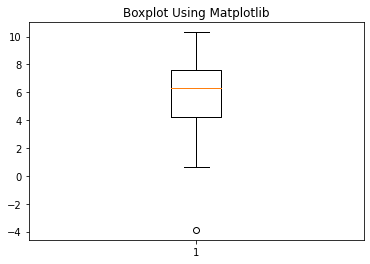

tensor(6.2528)

In [164]:
import matplotlib.pyplot as plt
import numpy as np

x = [ 8.1523,  5.3511,  8.7793,  6.5787,  5.4393,  8.4225,  3.2753,  6.8192,
         2.5730,  4.9262,  8.4467,  3.0767,  8.1434,  6.4935,  3.4832,  4.3634,
         6.4943,  6.2528,  7.5624,  7.3147,  5.5633, 10.3115,  7.6006,  7.6270,
         4.4854,  6.3217,  5.7052, -3.8797,  0.6570,  6.3649,  3.5108,  6.1363,
         4.8450,  5.6055,  8.8107,  7.7991,  1.2168,  3.0757,  4.7083,  6.9410,
         3.7927,  2.6014,  6.5423,  8.8566,  9.1873,  3.1449,  6.8574,  7.6244]
plt.boxplot(x)
plt.title("Boxplot Using Matplotlib")
plt.show()
torch.tensor(x).median()

In [162]:
torch.tensor([  6.9478,   5.2941,   8.1307,   6.2290,   5.6918,   8.2724,   3.5050,
          6.8454,   2.2958,   4.6588,   8.0109,   2.3397,   7.6179,   5.7914,
          3.6636,   4.0102,   6.5212,   5.9960,   7.6189,   7.3528,   4.5591,
          9.8945,   7.3332,   6.8857,   4.6805,   7.0419,   5.2593, -11.2870,
         -4.1089,   6.7169,   3.9132,   7.1294,   4.6938,   5.6342,   8.6400,
          7.8474,   0.1461,   3.2299,   6.1178,   7.2966,   3.5067,   3.1747,
          6.6243,   8.8297,   8.8441,   3.3038,   7.9714,   7.2132,   4.9681,
          6.4873]
).median()

tensor(6.1178)

In [165]:
torch.tensor([  7.9842,   5.4380,   8.3537,   6.2020,   5.5717,   8.3668,   3.3453,
          6.9851,   2.5869,   4.9232,   8.3026,   2.0469,   7.8339,   6.6055,
          4.0191,   4.1947,   6.4390,   6.0756,   7.6038,   7.7530,   4.6639,
          9.8568,   7.5999,   6.8557,   4.7194,   6.4351,   5.4264, -10.8261,
         -4.4903,   6.5457,   3.9175,   7.2216,   5.0332,   5.4373,   8.8550,
          8.0154,   0.9226,   3.3698,   6.4186,  7.35, 3.5067,   3.1747,
          6.6243,   8.8297,   8.8441,   3.3038,   7.9714,   7.2132,   4.9681,
          6.4873]).median()

tensor(6.4186)

In [98]:
class A():
    def __init__(self, x):
        self.v = x
    def forward(self, y):
        print(self.v+y)
    def hello(self):
        print('would you love me')

class B(A):
    def __init__(self, x):
        super(B, self).__init__(x)


In [100]:
b = B(2)
b.forward(3)
b.hello()


5
would you love me


In [102]:
44100 * 20 / 1024

861.328125

In [105]:
62*1024

63488